In [1]:
# Cell 1: Install required libraries (run once if not installed)
# !pip install transformers datasets torch matplotlib seaborn tqdm scikit-learn transformer_lens

# Cell 2: Import libraries and set device
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from transformers import AutoModelForCausalLM, AutoTokenizer
from datasets import load_dataset
from torch.utils.data import DataLoader
from sklearn.decomposition import PCA
import matplotlib.lines as mlines
from transformer_lens import HookedTransformer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda


In [2]:
# Cell 3: Define model paths
# Update these checkpoint paths as per your training output.
model_paths = {
    "base": "gpt2",  # Base GPT-2 model
    "epoch1": "./results/checkpoint-1563",   # Update with your actual checkpoint directory
    "epoch2": "./results/checkpoint-3126",    # Update with your actual checkpoint directory
    "epoch3": "./results/checkpoint-4686"     # Update with your actual checkpoint directory
}


In [3]:
# Cell 4: Load tokenizer
tokenizer = AutoTokenizer.from_pretrained("gpt2")
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token


In [4]:
# Cell 5: Load IMDb dataset and filter a small validation subset for analysis
dataset = load_dataset("imdb")

def filter_by_label(dataset_split, label, max_samples=50):
    filtered = [d for d in dataset_split if d["label"] == label]
    return filtered[:max_samples]

# We use the 'test' split for analysis
val_data = dataset["test"]
pos_samples = filter_by_label(val_data, 1, max_samples=50)
neg_samples = filter_by_label(val_data, 0, max_samples=50)
print(f"Positive samples: {len(pos_samples)}, Negative samples: {len(neg_samples)}")


Positive samples: 50, Negative samples: 50


In [5]:
# Cell 6: Tokenize positive and negative samples and move tensors to device
pos_toks = tokenizer(
    [s["text"] for s in pos_samples],
    padding="max_length",
    truncation=True,
    max_length=256,
    return_tensors="pt"
)
neg_toks = tokenizer(
    [s["text"] for s in neg_samples],
    padding="max_length",
    truncation=True,
    max_length=256,
    return_tensors="pt"
)

pos_input_ids = pos_toks["input_ids"].to(device)
pos_mask = pos_toks["attention_mask"].to(device)
neg_input_ids = neg_toks["input_ids"].to(device)
neg_mask = neg_toks["attention_mask"].to(device)


In [6]:
# Cell 7: Define a function to compute average residual activations per layer
def compute_avg_activations(tl_model, input_ids, attention_mask, batch_size=10):
    """
    Computes the average residual stream activation (at the last token)
    for each layer given the input_ids & attention_mask.
    Returns a list (length n_layers) of average activation tensors.
    """
    n_layers = tl_model.cfg.n_layers
    sum_activations = [None] * n_layers
    count = 0

    dataset_tensor = torch.utils.data.TensorDataset(input_ids, attention_mask)
    dataloader = DataLoader(dataset_tensor, batch_size=batch_size)

    for batch in dataloader:
        batch_ids, batch_mask = [t.to(device) for t in batch]
        with torch.no_grad():
            # Cache activations for all layers whose hook names include "hook_resid_pre"
            _, cache = tl_model.run_with_cache(
                batch_ids,
                attention_mask=batch_mask,
                names_filter=lambda name: "hook_resid_pre" in name
            )
        for layer in range(n_layers):
            act = cache[f"blocks.{layer}.hook_resid_pre"][:, -1, :]  # (batch_size, hidden_dim)
            if sum_activations[layer] is None:
                sum_activations[layer] = act.sum(dim=0)
            else:
                sum_activations[layer] += act.sum(dim=0)
        count += batch_ids.size(0)
        del cache
        torch.cuda.empty_cache()
    avg_activations = [s / count for s in sum_activations]
    return avg_activations


In [7]:
# Define the model paths
model_paths = {
    "base": "gpt2",                     # Base model from Hugging Face
    "1563": "./results/checkpoint-1563", # Finetuned checkpoint at epoch 1563
    "3126": "./results/checkpoint-3126", # Finetuned checkpoint at epoch 3126
    "4686": "./results/checkpoint-4686"  # Finetuned checkpoint at epoch 4686
}

results = {}  # To store {model_label: [norm_layer0, norm_layer1, ...]}

for model_label, model_path in model_paths.items():
    print(f"\nProcessing model: {model_label}")
    
    # For the base model, model_path is a recognized alias ("gpt2").
    # For checkpoints, model_path is a local directory.
    # In all cases, we load the model on CPU.
    hf_model = AutoModelForCausalLM.from_pretrained(model_path)
    hf_model.config.pad_token_id = tokenizer.pad_token_id
    # Do NOT call hf_model.to(device); keep it on CPU.
    
    # Pass the loaded HF model to Transformer Lens using a recognized alias ("gpt2")
    tl_model = HookedTransformer.from_pretrained(
        "gpt2",       # recognized official alias for GPT-2
        hf_model=hf_model,
        device=device  # Transformer Lens will move it to device
    )
    tl_model.eval()
    
    # Compute average activations for positive and negative samples.
    pos_avg = compute_avg_activations(tl_model, pos_input_ids, pos_mask, batch_size=10)
    neg_avg = compute_avg_activations(tl_model, neg_input_ids, neg_mask, batch_size=10)
    
    n_layers = tl_model.cfg.n_layers
    layer_norms = []
    for layer in range(n_layers):
        sentiment_dir = pos_avg[layer] - neg_avg[layer]
        norm = torch.norm(sentiment_dir).item()
        layer_norms.append(norm)
        print(f"{model_label} - Layer {layer}: Sentiment direction norm = {norm:.4f}")
    
    results[model_label] = layer_norms
    
    # Clean up for the next iteration
    del hf_model, tl_model, pos_avg, neg_avg
    torch.cuda.empty_cache()



Processing model: base
Loaded pretrained model gpt2 into HookedTransformer
base - Layer 0: Sentiment direction norm = 0.3947
base - Layer 1: Sentiment direction norm = 5.3281
base - Layer 2: Sentiment direction norm = 6.1339
base - Layer 3: Sentiment direction norm = 6.6156
base - Layer 4: Sentiment direction norm = 7.0147
base - Layer 5: Sentiment direction norm = 8.1803
base - Layer 6: Sentiment direction norm = 8.9491
base - Layer 7: Sentiment direction norm = 9.7784
base - Layer 8: Sentiment direction norm = 11.9595
base - Layer 9: Sentiment direction norm = 14.2080
base - Layer 10: Sentiment direction norm = 17.1533
base - Layer 11: Sentiment direction norm = 21.1554

Processing model: 1563
Loaded pretrained model gpt2 into HookedTransformer
1563 - Layer 0: Sentiment direction norm = 0.3944
1563 - Layer 1: Sentiment direction norm = 5.6858
1563 - Layer 2: Sentiment direction norm = 6.8720
1563 - Layer 3: Sentiment direction norm = 7.0601
1563 - Layer 4: Sentiment direction norm =

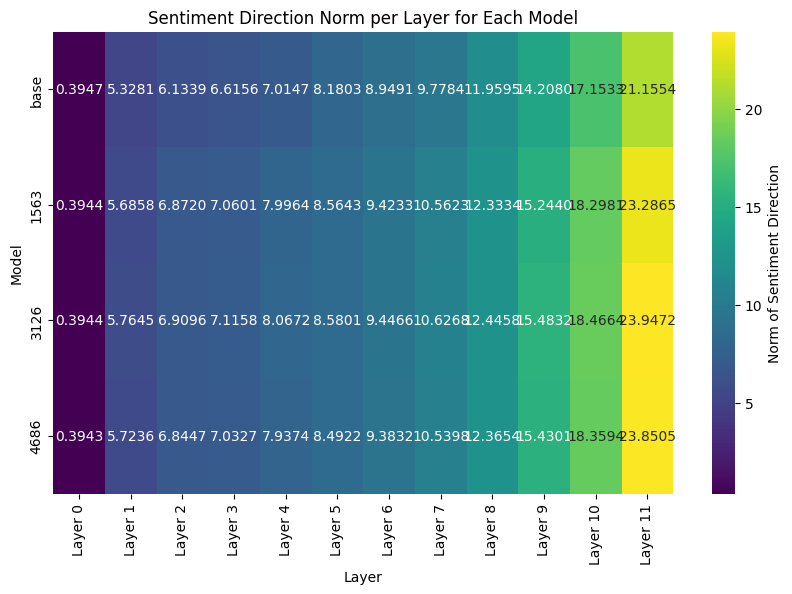

In [8]:
# Cell 9: Create a heatmap of sentiment direction norms
# Rows correspond to different models; columns correspond to layers.
model_names = list(results.keys())
n_layers = len(results[model_names[0]])
data = np.array([results[m] for m in model_names])

plt.figure(figsize=(10, 6))
sns.heatmap(
    data,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    xticklabels=[f"Layer {i}" for i in range(n_layers)],
    yticklabels=model_names,
    cbar_kws={'label': 'Norm of Sentiment Direction'}
)
plt.title("Sentiment Direction Norm per Layer for Each Model")
plt.xlabel("Layer")
plt.ylabel("Model")
plt.show()


In [9]:
# Cell 10: For PCA visualization – define a function to collect all activations for each layer.
def get_all_activations(tl_model, input_ids, attention_mask, batch_size=10):
    """
    Collects activations (from the last token) for all samples in the provided inputs.
    Returns a list of numpy arrays (one per layer) with shape (num_samples, hidden_dim).
    """
    n_layers = tl_model.cfg.n_layers
    all_acts = [[] for _ in range(n_layers)]
    dataset_tensor = torch.utils.data.TensorDataset(input_ids, attention_mask)
    dataloader = DataLoader(dataset_tensor, batch_size=batch_size)
    
    for batch in dataloader:
        batch_ids, batch_mask = [t.to(device) for t in batch]
        with torch.no_grad():
            _, cache = tl_model.run_with_cache(
                batch_ids,
                attention_mask=batch_mask,
                names_filter=lambda name: "hook_resid_pre" in name
            )
        for layer in range(n_layers):
            act = cache[f"blocks.{layer}.hook_resid_pre"][:, -1, :]  # (batch_size, hidden_dim)
            all_acts[layer].append(act.cpu())
        del cache
        torch.cuda.empty_cache()
    # Concatenate along the batch dimension and convert to numpy
    all_acts = [torch.cat(a, dim=0).numpy() for a in all_acts]
    return all_acts


Loaded pretrained model gpt2 into HookedTransformer


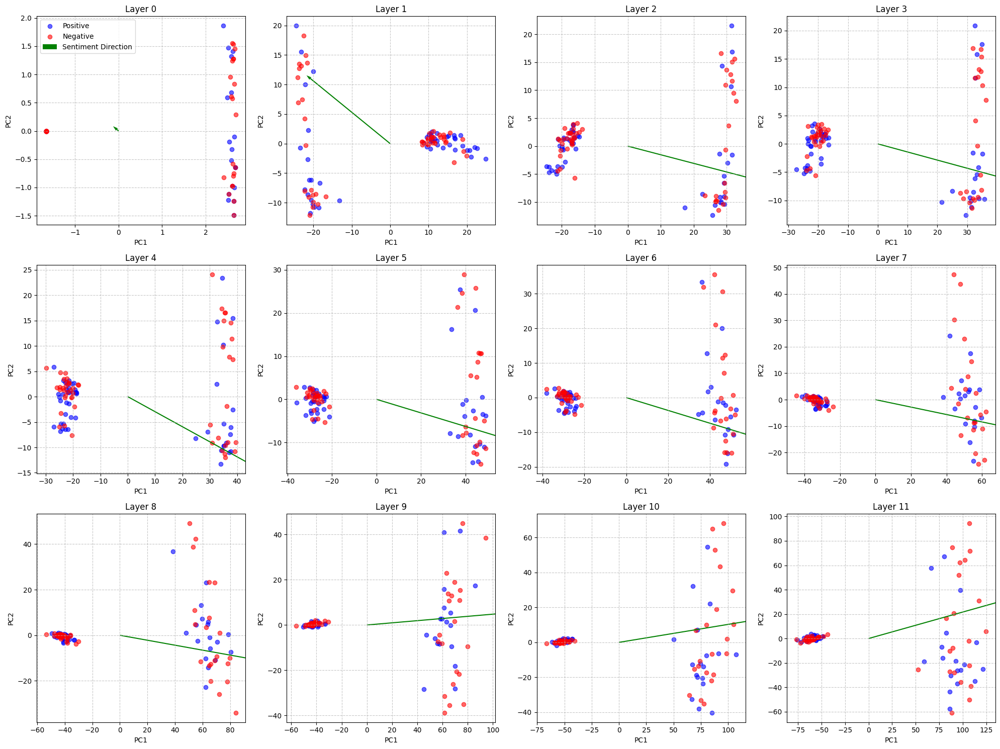

In [10]:
# Cell 11: Perform PCA-based visualization for one model (here, the base model)
# This will show, for each layer, a 2D projection of positive and negative activations,
# along with the sentiment direction (difference of means) overlaid.

model_label = "base"

# Load the HF model from the local checkpoint on CPU (do NOT call hf_model.to(device))
hf_model = AutoModelForCausalLM.from_pretrained(model_paths[model_label])
hf_model.config.pad_token_id = tokenizer.pad_token_id

# Use a recognized alias ("gpt2") and pass the loaded hf_model
tl_model = HookedTransformer.from_pretrained(
    "gpt2",                # recognized model alias
    hf_model=hf_model,
    device=device,
    move_to_device=False   # load state dict on CPU first
)

# Manually move modules to the device without passing an argument
tl_model.move_model_modules_to_device()
tl_model.eval()

# Get full activations for positive and negative sets
pos_all_acts = get_all_activations(tl_model, pos_input_ids, pos_mask, batch_size=10)
neg_all_acts = get_all_activations(tl_model, neg_input_ids, neg_mask, batch_size=10)

n_layers = tl_model.cfg.n_layers
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
axs = axs.flatten()

for layer in range(n_layers):
    pos_acts = pos_all_acts[layer]   # shape: (num_samples, hidden_dim)
    neg_acts = neg_all_acts[layer]
    all_acts = np.concatenate([pos_acts, neg_acts], axis=0)
    
    # Perform PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    pca_acts = pca.fit_transform(all_acts)
    pos_pca = pca_acts[:len(pos_acts)]
    neg_pca = pca_acts[len(pos_acts):]
    
    # Compute sentiment direction (difference of means in original space) and project to 2D
    pos_mean = np.mean(pos_acts, axis=0)
    neg_mean = np.mean(neg_acts, axis=0)
    sentiment_dir = pos_mean - neg_mean
    sentiment_dir_2d = pca.transform(sentiment_dir.reshape(1, -1))[0]
    
    ax = axs[layer]
    ax.scatter(pos_pca[:, 0], pos_pca[:, 1], c='blue', alpha=0.6, label='Positive')
    ax.scatter(neg_pca[:, 0], neg_pca[:, 1], c='red', alpha=0.6, label='Negative')
    # Draw an arrow representing the sentiment direction in 2D
    ax.quiver(0, 0, sentiment_dir_2d[0], sentiment_dir_2d[1],
              color='green', scale=10, width=0.005, label='Sentiment Direction')
    ax.set_title(f"Layer {layer}")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.grid(True, linestyle='--', alpha=0.7)
    if layer == 0:
        ax.legend()
plt.tight_layout()
plt.show()

# Clean up memory
del hf_model, tl_model, pos_all_acts, neg_all_acts
torch.cuda.empty_cache()


# Finetuned Visualization

Loaded pretrained model gpt2 into HookedTransformer


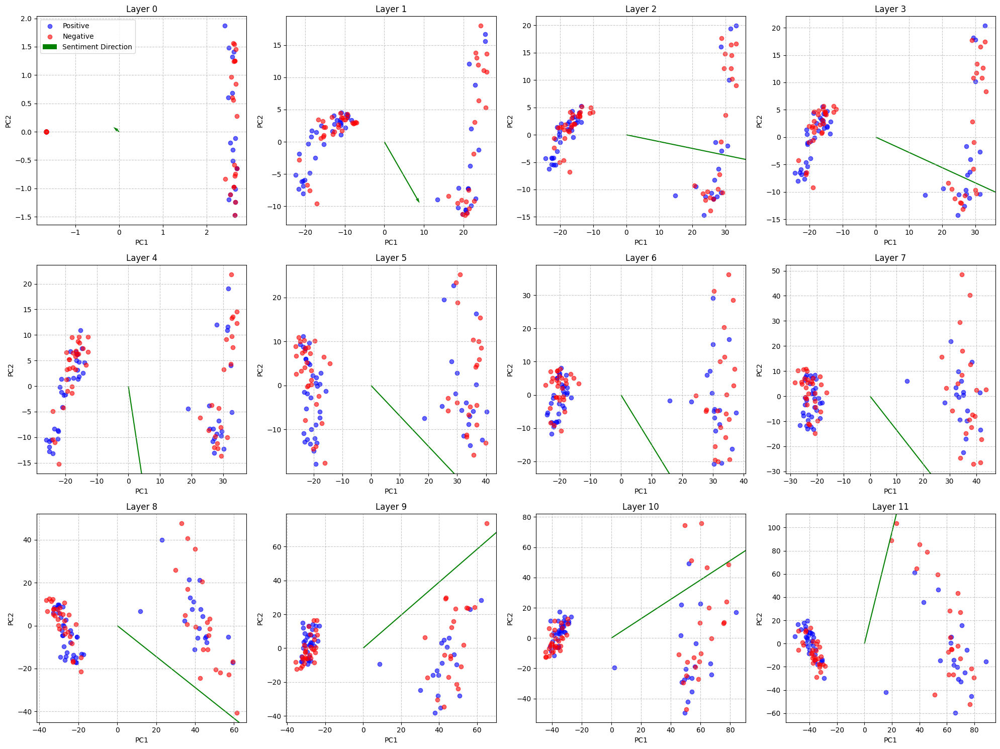

In [11]:
# Cell 11: Perform PCA-based visualization for one model (here, the base model)
# This will show, for each layer, a 2D projection of positive and negative activations,
# along with the sentiment direction (difference of means) overlaid.

# model_label = "base"
model_path = './results/checkpoint-3126'
# Load the HF model from the local checkpoint on CPU (do NOT call hf_model.to(device))
# hf_model = AutoModelForCausalLM.from_pretrained(model_paths[model_label])
hf_model = AutoModelForCausalLM.from_pretrained(model_path)
hf_model.config.pad_token_id = tokenizer.pad_token_id

# Use a recognized alias ("gpt2") and pass the loaded hf_model
tl_model = HookedTransformer.from_pretrained(
    "gpt2",                # recognized model alias
    hf_model=hf_model,
    device=device,
    move_to_device=False   # load state dict on CPU first
)

# Manually move modules to the device without passing an argument
tl_model.move_model_modules_to_device()
tl_model.eval()

# Get full activations for positive and negative sets
pos_all_acts = get_all_activations(tl_model, pos_input_ids, pos_mask, batch_size=10)
neg_all_acts = get_all_activations(tl_model, neg_input_ids, neg_mask, batch_size=10)

n_layers = tl_model.cfg.n_layers
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
axs = axs.flatten()

for layer in range(n_layers):
    pos_acts = pos_all_acts[layer]   # shape: (num_samples, hidden_dim)
    neg_acts = neg_all_acts[layer]
    all_acts = np.concatenate([pos_acts, neg_acts], axis=0)
    
    # Perform PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    pca_acts = pca.fit_transform(all_acts)
    pos_pca = pca_acts[:len(pos_acts)]
    neg_pca = pca_acts[len(pos_acts):]
    
    # Compute sentiment direction (difference of means in original space) and project to 2D
    pos_mean = np.mean(pos_acts, axis=0)
    neg_mean = np.mean(neg_acts, axis=0)
    sentiment_dir = pos_mean - neg_mean
    sentiment_dir_2d = pca.transform(sentiment_dir.reshape(1, -1))[0]
    
    ax = axs[layer]
    ax.scatter(pos_pca[:, 0], pos_pca[:, 1], c='blue', alpha=0.6, label='Positive')
    ax.scatter(neg_pca[:, 0], neg_pca[:, 1], c='red', alpha=0.6, label='Negative')
    # Draw an arrow representing the sentiment direction in 2D
    ax.quiver(0, 0, sentiment_dir_2d[0], sentiment_dir_2d[1],
              color='green', scale=10, width=0.005, label='Sentiment Direction')
    ax.set_title(f"Layer {layer}")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.grid(True, linestyle='--', alpha=0.7)
    if layer == 0:
        ax.legend()
plt.tight_layout()
plt.show()

# Clean up memory
del hf_model, tl_model, pos_all_acts, neg_all_acts
torch.cuda.empty_cache()


Using device: cuda
Using 1012 token IDs for t-SNE visualization.

Processing base model...
Embeddings shape: (1012, 768)


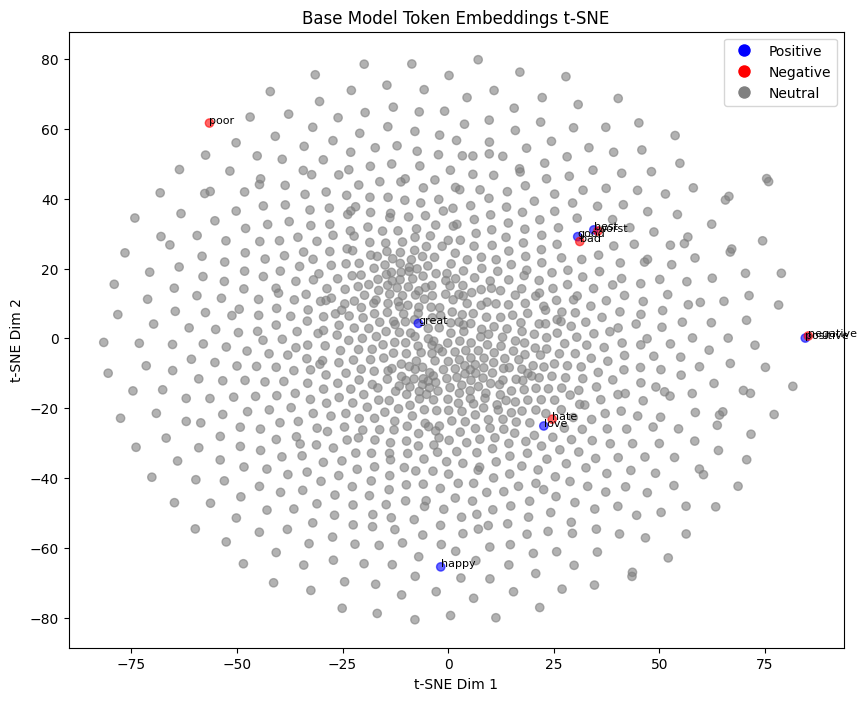


Processing finetuned model...
Embeddings shape: (1012, 768)


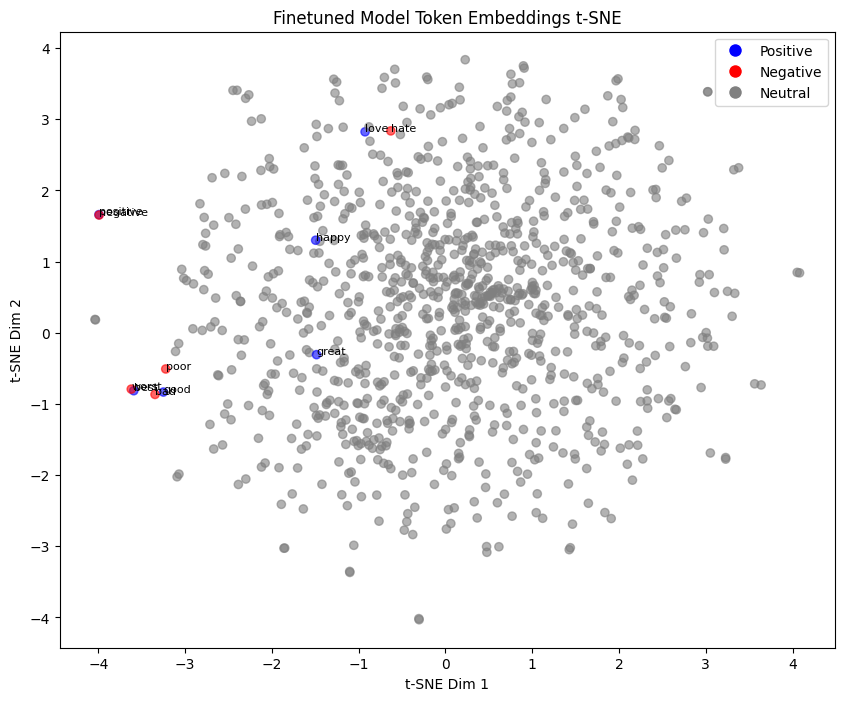

In [12]:
import torch
from transformers import AutoModelForCausalLM, AutoTokenizer
import random
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# Set up device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# 1. Load the GPT-2 Tokenizer
# -----------------------------
tokenizer = AutoTokenizer.from_pretrained("gpt2")
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# -----------------------------
# 2. Define Sentiment Token Lists
# -----------------------------
# We define sentiment tokens without any leading spaces.
positive_tokens = ["good", "great", "happy", "love", "excellent", "amazing", "wonderful", "fantastic", "positive", "best"]
negative_tokens = ["bad", "terrible", "sad", "hate", "awful", "poor", "worst", "negative", "disappoint", "horrible", "angry"]

# Helper: safely get token id (returns None if not found)
def get_token_id(tokenizer, token):
    try:
        return tokenizer.convert_tokens_to_ids(token)
    except Exception:
        return None

# -----------------------------
# 3. Create a Subset of Token IDs
# -----------------------------
def get_subset_token_ids(tokenizer, sample_size=1000, extra_tokens=[]):
    # Sample a random subset of token IDs from the vocabulary.
    all_ids = list(range(tokenizer.vocab_size))
    sample_ids = set(random.sample(all_ids, sample_size))
    # Ensure extra tokens (e.g. sentiment words) are included.
    for token in extra_tokens:
        tid = get_token_id(tokenizer, token)
        if tid is not None:
            sample_ids.add(tid)
    return sorted(list(sample_ids))

# Here we make sure our extra tokens (as defined below) are included.
extra_tokens = positive_tokens + negative_tokens
subset_ids = get_subset_token_ids(tokenizer, sample_size=1000, extra_tokens=extra_tokens)
print(f"Using {len(subset_ids)} token IDs for t-SNE visualization.")

# -----------------------------
# 4. Function to Extract Token Embeddings
# -----------------------------
def get_token_embeddings(model, token_ids):
    # Get the input embedding matrix; shape: (vocab_size, hidden_dim)
    emb = model.get_input_embeddings().weight.data.cpu().numpy()
    # Select embeddings for the subset of token IDs.
    return emb[token_ids]

# -----------------------------
# 5. Function to Run t-SNE on Embeddings
# -----------------------------
def compute_tsne(embeddings, random_state=42):
    tsne = TSNE(n_components=2, random_state=random_state, perplexity=30, learning_rate="auto", init="pca")
    return tsne.fit_transform(embeddings)

# -----------------------------
# 6. Updated Plotting Function with Cleaned Tokens
# -----------------------------
def plot_token_embeddings(tsne_embeddings, token_ids, tokenizer, positive_tokens, negative_tokens, title=""):
    # Get tokens from IDs.
    tokens = [tokenizer.convert_ids_to_tokens(tid) for tid in token_ids]
    # Clean tokens: remove "Ġ" and extra whitespace, then lower-case.
    cleaned_tokens = [token.lstrip("Ġ").strip().lower() for token in tokens]
    
    # Determine colors based on sentiment match.
    colors = []
    labels = []
    pos_set = set([t.strip().lower() for t in positive_tokens])
    neg_set = set([t.strip().lower() for t in negative_tokens])
    
    for token in cleaned_tokens:
        if token in pos_set:
            colors.append("blue")
            labels.append("Positive")
        elif token in neg_set:
            colors.append("red")
            labels.append("Negative")
        else:
            colors.append("gray")
            labels.append("Neutral")
    
    plt.figure(figsize=(10,8))
    plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=colors, alpha=0.6)
    
    # Annotate only sentiment tokens.
    for i, token in enumerate(cleaned_tokens):
        if labels[i] != "Neutral":
            plt.annotate(token, (tsne_embeddings[i, 0], tsne_embeddings[i, 1]), fontsize=8)
    
    plt.title(title)
    plt.xlabel("t-SNE Dim 1")
    plt.ylabel("t-SNE Dim 2")
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Positive', markerfacecolor='blue', markersize=10),
        Line2D([0], [0], marker='o', color='w', label='Negative', markerfacecolor='red', markersize=10),
        Line2D([0], [0], marker='o', color='w', label='Neutral', markerfacecolor='gray', markersize=10)
    ]
    plt.legend(handles=legend_elements)
    plt.show()

# -----------------------------
# 7. Visualize Token Embeddings for Both Models
# -----------------------------
# Define model versions.
model_versions = {
    "base": "gpt2",
    "finetuned": "./results/checkpoint-3126"  # update to your checkpoint directory
}

for version_label, model_path in model_versions.items():
    print(f"\nProcessing {version_label} model...")
    # Load the model on CPU.
    model = AutoModelForCausalLM.from_pretrained(model_path)
    model.config.pad_token_id = tokenizer.pad_token_id
    model.to(device)
    model.eval()
    
    # Extract embeddings for our subset of token IDs.
    embeddings = get_token_embeddings(model, subset_ids)
    print(f"Embeddings shape: {embeddings.shape}")
    
    # Run t-SNE.
    tsne_emb = compute_tsne(embeddings)
    
    # Plot the t-SNE result.
    plot_title = f"{version_label.capitalize()} Model Token Embeddings t-SNE"
    plot_token_embeddings(tsne_emb, subset_ids, tokenizer, positive_tokens, negative_tokens, title=plot_title)
    
    # Clean up.
    del model
    torch.cuda.empty_cache()


Using device: cuda
Loading base model embeddings...
Loading finetuned model embeddings...
Running t-SNE on base model embeddings (this may take several minutes)...


Running t-SNE on finetuned model embeddings (this may take several minutes)...


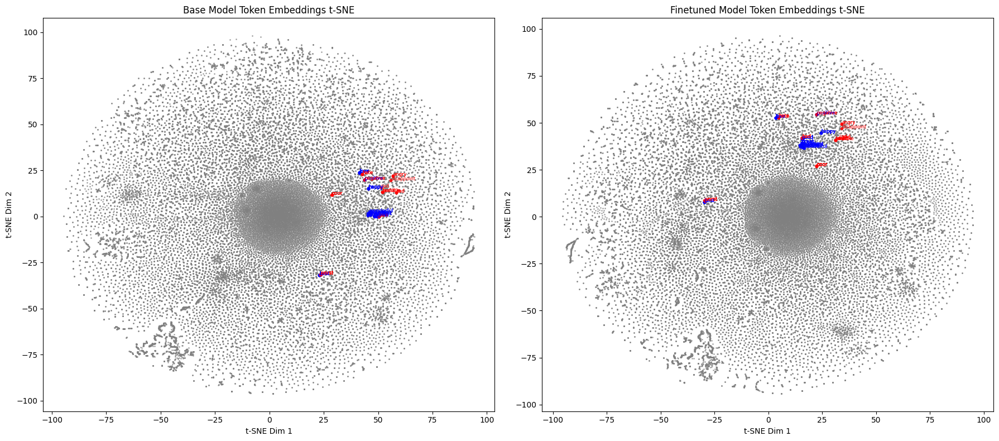

In [16]:
import torch
from transformers import AutoModelForCausalLM, AutoTokenizer
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Set up device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# 1. Load Tokenizer and Sentiment Token Lists
# -----------------------------
tokenizer = AutoTokenizer.from_pretrained("gpt2")
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Define sentiment tokens (without leading spaces)
positive_tokens = ["good", "great", "happy", "love", "excellent", "amazing", "wonderful", "fantastic", "positive", "best"]
negative_tokens = ["bad", "terrible", "sad", "hate", "awful", "poor", "worst", "negative", "disappoint", "horrible", "angry"]

# Clean a token (for matching): remove any leading special characters and lowercase.
def clean_token(tok):
    return tok.lstrip("Ġ").strip().lower()

# Create sets for quick lookup.
pos_set = set([t.lower() for t in positive_tokens])
neg_set = set([t.lower() for t in negative_tokens])

# -----------------------------
# 2. Load Full Token Embeddings from Each Model
# -----------------------------
def load_embeddings(model_path, is_base=False):
    """
    Loads a model from the given path and returns its full token embeddings (numpy array).
    For the base model, use a recognized alias (e.g. "gpt2").
    """
    if is_base:
        hf_model = AutoModelForCausalLM.from_pretrained("gpt2")
    else:
        hf_model = AutoModelForCausalLM.from_pretrained(model_path)
    hf_model.config.pad_token_id = tokenizer.pad_token_id
    hf_model.to(device)
    hf_model.eval()
    # Extract the input embedding matrix. Shape: (vocab_size, hidden_dim)
    embeddings = hf_model.get_input_embeddings().weight.data.cpu().numpy()
    del hf_model
    torch.cuda.empty_cache()
    return embeddings

# Load embeddings for base and finetuned models.
print("Loading base model embeddings...")
base_embeddings = load_embeddings("gpt2", is_base=True)
print("Loading finetuned model embeddings...")
# Update the checkpoint path for your finetuned model below:
finetuned_embeddings = load_embeddings("./results/checkpoint-1563", is_base=False)

# Also get all token strings for the vocabulary.
vocab_size = tokenizer.vocab_size
all_tokens = [tokenizer.convert_ids_to_tokens(i) for i in range(vocab_size)]
cleaned_tokens = [clean_token(tok) for tok in all_tokens]

# -----------------------------
# 3. Run t-SNE on the Full Embedding Matrix
# -----------------------------
print("Running t-SNE on base model embeddings (this may take several minutes)...")
tsne_base = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000).fit_transform(base_embeddings)
print("Running t-SNE on finetuned model embeddings (this may take several minutes)...")
tsne_finetuned = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000).fit_transform(finetuned_embeddings)

# -----------------------------
# 4. Plot the t-SNE Results Side by Side
# -----------------------------
fig, axs = plt.subplots(1, 2, figsize=(18, 8))

def plot_tsne(ax, tsne_data, title):
    # Plot all tokens as small gray dots.
    ax.scatter(tsne_data[:, 0], tsne_data[:, 1], s=1, alpha=0.6, color='gray')
    
    # For tokens that match our sentiment lists, annotate and color them.
    for i, token in enumerate(cleaned_tokens):
        if token in pos_set:
            ax.scatter(tsne_data[i, 0], tsne_data[i, 1], s=10, color='blue', alpha=0.8)
            ax.annotate(token, (tsne_data[i, 0], tsne_data[i, 1]), fontsize=6, color='blue')
        elif token in neg_set:
            ax.scatter(tsne_data[i, 0], tsne_data[i, 1], s=10, color='red', alpha=0.8)
            ax.annotate(token, (tsne_data[i, 0], tsne_data[i, 1]), fontsize=6, color='red')
    
    ax.set_title(title)
    ax.set_xlabel("t-SNE Dim 1")
    ax.set_ylabel("t-SNE Dim 2")

plot_tsne(axs[0], tsne_base, "Base Model Token Embeddings t-SNE")
plot_tsne(axs[1], tsne_finetuned, "Finetuned Model Token Embeddings t-SNE")
plt.tight_layout()
plt.show()


In [17]:
import numpy as np

# Compute L2 norm (Euclidean distance) between embeddings before and after finetuning.
embedding_differences = np.linalg.norm(base_embeddings - finetuned_embeddings, axis=1)

# Get the top N most changed tokens
top_n = 20  # Adjust as needed
most_changed_indices = np.argsort(embedding_differences)[-top_n:][::-1]  # Get indices of top N changes
most_changed_tokens = [cleaned_tokens[i] for i in most_changed_indices]
most_changed_values = embedding_differences[most_changed_indices]

# Print the most changed tokens
print("Top tokens most affected by finetuning:")
for token, change in zip(most_changed_tokens, most_changed_values):
    print(f"{token}: {change:.4f}")


Top tokens most affected by finetuning:
âģ¦: 0.4073
âģķ: 0.3906
[...]: 0.3887
fucking: 0.3869
wet: 0.3725
âģĵ: 0.3696
canon: 0.3686
âģķ: 0.3679
decl: 0.3657
nigerian: 0.3652
pissed: 0.3632
arri: 0.3627
âģ¦.: 0.3614
fucked: 0.3605
alleg: 0.3602
defensive: 0.3583
fuckin: 0.3580
âģ¦: 0.3577
[âģ¦]: 0.3568
ï¿½: 0.3559


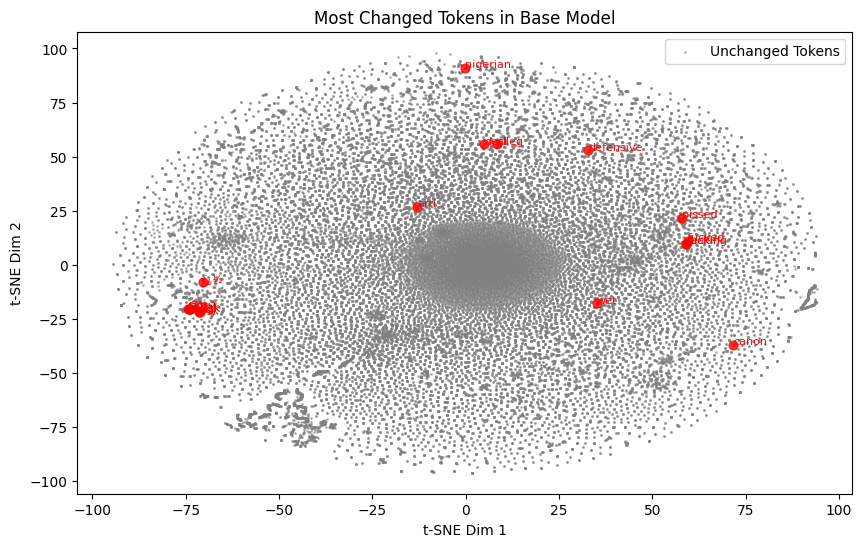

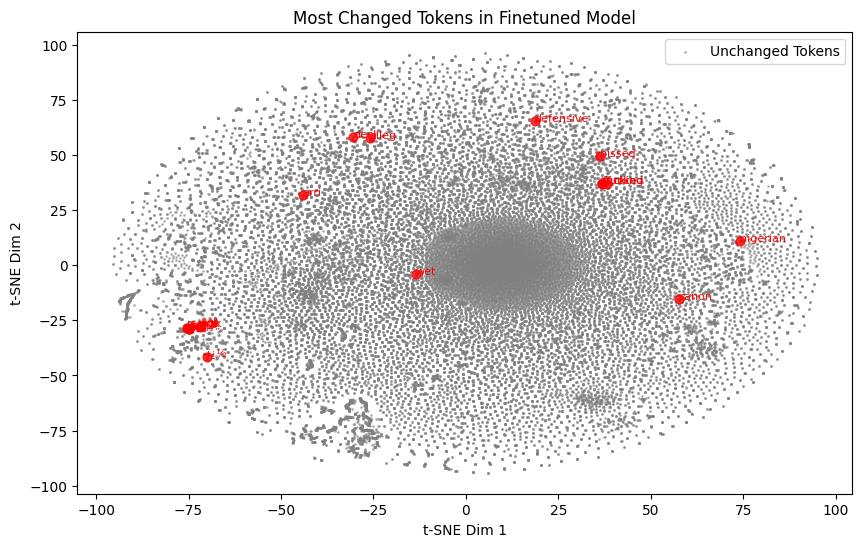

In [18]:
def plot_most_changed_tokens(tsne_base, tsne_finetuned, most_changed_indices, title=""):
    plt.figure(figsize=(10, 6))
    
    # Plot all tokens as light gray dots
    plt.scatter(tsne_base[:, 0], tsne_base[:, 1], s=1, color="gray", alpha=0.5, label="Unchanged Tokens")
    
    # Plot most changed tokens in red
    for idx in most_changed_indices:
        plt.scatter(tsne_base[idx, 0], tsne_base[idx, 1], s=40, color="red", alpha=0.8)
        plt.annotate(cleaned_tokens[idx], (tsne_base[idx, 0], tsne_base[idx, 1]), fontsize=8, color="red")
    
    plt.title(title)
    plt.xlabel("t-SNE Dim 1")
    plt.ylabel("t-SNE Dim 2")
    plt.legend()
    plt.show()

# Plot for base model
plot_most_changed_tokens(tsne_base, tsne_finetuned, most_changed_indices, title="Most Changed Tokens in Base Model")

# Plot for finetuned model
plot_most_changed_tokens(tsne_finetuned, tsne_base, most_changed_indices, title="Most Changed Tokens in Finetuned Model")


In [19]:
# Find indices of positive and negative sentiment words
pos_indices = [i for i, token in enumerate(cleaned_tokens) if token in pos_set]
neg_indices = [i for i, token in enumerate(cleaned_tokens) if token in neg_set]

# Compute average movement for sentiment words
pos_shift = np.mean(embedding_differences[pos_indices])
neg_shift = np.mean(embedding_differences[neg_indices])

print(f"Average embedding shift for POSITIVE sentiment words: {pos_shift:.4f}")
print(f"Average embedding shift for NEGATIVE sentiment words: {neg_shift:.4f}")


Average embedding shift for POSITIVE sentiment words: 0.0623
Average embedding shift for NEGATIVE sentiment words: 0.0703


In [20]:
import torch
import numpy as np
from transformers import AutoModelForCausalLM, AutoTokenizer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def compute_sentiment_direction(model, tokenizer, positive_words, negative_words):
    """
    Computes the sentiment direction vector by taking the mean difference
    between positive and negative token embeddings.
    """
    # Use the exact token forms that appear in GPT-2's vocabulary.
    # For GPT-2, tokens often have a leading "Ġ" indicating a space.
    token_ids_pos = [tokenizer.convert_tokens_to_ids(w) for w in positive_words if tokenizer.convert_tokens_to_ids(w) is not None]
    token_ids_neg = [tokenizer.convert_tokens_to_ids(w) for w in negative_words if tokenizer.convert_tokens_to_ids(w) is not None]
    
    if len(token_ids_pos) == 0 or len(token_ids_neg) == 0:
        print("Error: Some sentiment tokens were not found in the vocabulary.")
        print("Positive token IDs:", token_ids_pos)
        print("Negative token IDs:", token_ids_neg)
        return None

    embeddings = model.get_input_embeddings().weight.data.cpu().numpy()
    
    # Compute the average embedding for positive and negative tokens
    pos_vec = np.mean(embeddings[token_ids_pos], axis=0)
    neg_vec = np.mean(embeddings[token_ids_neg], axis=0)
    
    sentiment_direction = pos_vec - neg_vec
    norm = np.linalg.norm(sentiment_direction)
    if norm == 0:
        print("Warning: Sentiment direction vector is zero. Returning unnormalized vector.")
        return sentiment_direction
    return sentiment_direction / norm

# Load models
base_model = AutoModelForCausalLM.from_pretrained("gpt2").to(device)
finetuned_model = AutoModelForCausalLM.from_pretrained("./results/checkpoint-1563").to(device)

# Use GPT-2’s actual token forms (with the leading "Ġ")
positive_words = ["Ġgood", "Ġgreat", "Ġhappy", "Ġlove", "Ġexcellent", "Ġamazing", "Ġwonderful"]
negative_words = ["Ġbad", "Ġterrible", "Ġsad", "Ġhate", "Ġawful", "Ġpoor", "Ġworst"]

base_sentiment_dir = compute_sentiment_direction(base_model, tokenizer, positive_words, negative_words)
finetuned_sentiment_dir = compute_sentiment_direction(finetuned_model, tokenizer, positive_words, negative_words)

if base_sentiment_dir is not None and finetuned_sentiment_dir is not None:
    cosine_similarity = np.dot(base_sentiment_dir, finetuned_sentiment_dir)
    print(f"Cosine similarity between base and finetuned sentiment direction: {cosine_similarity:.4f}")
else:
    print("Error: Could not compute sentiment direction.")


Cosine similarity between base and finetuned sentiment direction: 0.9997


In [21]:
base_model = AutoModelForCausalLM.from_pretrained("gpt2").to(device)
finetuned_model = AutoModelForCausalLM.from_pretrained("./results/checkpoint-1563").to(device)

# Use GPT-2’s actual token forms (with the leading "Ġ")
positive_words2 = ["Ġfucking"]
negative_words2 = ["Ġdefensive"]

base_sentiment_dir2 = compute_sentiment_direction(base_model, tokenizer, positive_words2, negative_words2)
finetuned_sentiment_dir2 = compute_sentiment_direction(finetuned_model, tokenizer, positive_words2, negative_words2)

if base_sentiment_dir2 is not None and finetuned_sentiment_dir2 is not None:
    cosine_similarity = np.dot(base_sentiment_dir2, finetuned_sentiment_dir2)
    print(f"Cosine similarity between base and finetuned sentiment direction: {cosine_similarity:.4f}")
else:
    print("Error: Could not compute sentiment direction.")


Cosine similarity between base and finetuned sentiment direction: 0.9989


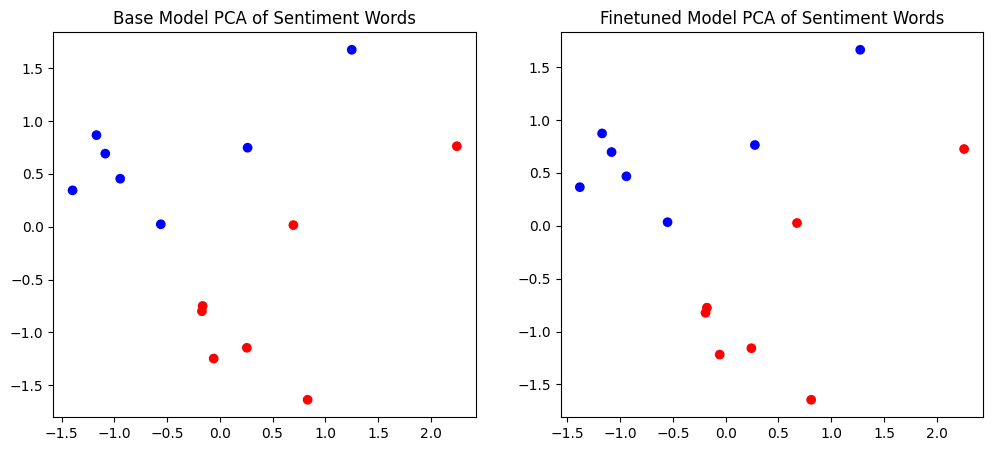

In [22]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def compute_pca_projection(model, tokenizer, token_list):
    """
    Extracts embeddings for a set of tokens and projects them onto their first two principal components.
    """
    token_ids = [tokenizer.convert_tokens_to_ids(w) for w in token_list if w in tokenizer.get_vocab()]
    embeddings = model.get_input_embeddings().weight.data.cpu().numpy()[token_ids]

    pca = PCA(n_components=2)
    pca_projection = pca.fit_transform(embeddings)

    return pca_projection, pca

# Compute PCA for sentiment words
pca_base, pca_base_model = compute_pca_projection(base_model, tokenizer, positive_words + negative_words)
pca_finetuned, pca_finetuned_model = compute_pca_projection(finetuned_model, tokenizer, positive_words + negative_words)

# Plot PCA projections
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(pca_base[:, 0], pca_base[:, 1], c=['blue']*len(positive_words) + ['red']*len(negative_words))
plt.title("Base Model PCA of Sentiment Words")

plt.subplot(1, 2, 2)
plt.scatter(pca_finetuned[:, 0], pca_finetuned[:, 1], c=['blue']*len(positive_words) + ['red']*len(negative_words))
plt.title("Finetuned Model PCA of Sentiment Words")

plt.show()


In [23]:
import torch
import numpy as np
from transformers import AutoModelForCausalLM, AutoTokenizer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def compute_sentiment_direction_raw(model, tokenizer, positive_words, negative_words):
    """
    Computes the raw sentiment direction vector (without normalization) by taking 
    the difference between the average embeddings of positive and negative tokens.
    Returns the raw vector and its L2 norm.
    """
    # Use GPT-2's vocabulary token forms (with the leading "Ġ")
    token_ids_pos = [tokenizer.convert_tokens_to_ids(w) for w in positive_words if tokenizer.convert_tokens_to_ids(w) is not None]
    token_ids_neg = [tokenizer.convert_tokens_to_ids(w) for w in negative_words if tokenizer.convert_tokens_to_ids(w) is not None]
    
    if len(token_ids_pos) == 0 or len(token_ids_neg) == 0:
        print("Error: Some sentiment tokens were not found in the vocabulary.")
        print("Positive token IDs:", token_ids_pos)
        print("Negative token IDs:", token_ids_neg)
        return None, None

    embeddings = model.get_input_embeddings().weight.data.cpu().numpy()
    
    # Compute average embeddings for positive and negative tokens
    pos_vec = np.mean(embeddings[token_ids_pos], axis=0)
    neg_vec = np.mean(embeddings[token_ids_neg], axis=0)
    
    # Compute the raw sentiment direction vector and its L2 norm
    sentiment_direction = pos_vec - neg_vec
    norm = np.linalg.norm(sentiment_direction)
    return sentiment_direction, norm

# Load tokenizer
tokenizer = AutoTokenizer.from_pretrained("gpt2")
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Define sentiment words using GPT-2 token forms (with leading "Ġ")
positive_words = ["Ġgood", "Ġgreat", "Ġhappy", "Ġlove", "Ġexcellent", "Ġamazing", "Ġwonderful"]
negative_words = ["Ġbad", "Ġterrible", "Ġsad", "Ġhate", "Ġawful", "Ġpoor", "Ġworst"]

# Load Base Model (on CPU, then move to device)
base_model = AutoModelForCausalLM.from_pretrained("gpt2")
base_model.config.pad_token_id = tokenizer.pad_token_id
base_model.to(device)
base_model.eval()

# Load Finetuned Model (update path as needed)
finetuned_model_path = "./results/checkpoint-3126"  # update to your checkpoint
finetuned_model = AutoModelForCausalLM.from_pretrained(finetuned_model_path)
finetuned_model.config.pad_token_id = tokenizer.pad_token_id
finetuned_model.to(device)
finetuned_model.eval()

# Compute sentiment direction and its norm for the base model
base_direction, base_norm = compute_sentiment_direction_raw(base_model, tokenizer, positive_words, negative_words)
print(f"Base Model Sentiment Direction Norm: {base_norm:.4f}")

# Compute sentiment direction and its norm for the finetuned model
finetuned_direction, finetuned_norm = compute_sentiment_direction_raw(finetuned_model, tokenizer, positive_words, negative_words)
print(f"Finetuned Model Sentiment Direction Norm: {finetuned_norm:.4f}")

# Compare the norms
if base_norm is not None and finetuned_norm is not None:
    if finetuned_norm > base_norm:
        print("Finetuning amplified the sentiment feature (increased magnitude).")
    else:
        print("Finetuning did not amplify the sentiment feature (or reduced its magnitude).")

# Clear models from GPU memory
del base_model, finetuned_model
torch.cuda.empty_cache()


Base Model Sentiment Direction Norm: 1.8266
Finetuned Model Sentiment Direction Norm: 1.8234
Finetuning did not amplify the sentiment feature (or reduced its magnitude).


In [24]:
import torch
import numpy as np
from transformers import AutoModelForCausalLM, AutoTokenizer
from datasets import load_dataset
from torch.utils.data import DataLoader, TensorDataset
import plotly.express as px
import tqdm

# Set up device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# 1. Load a subset of the IMDb test dataset for evaluation
# -----------------------------
dataset = load_dataset("imdb", split="test")
# Select the first 200 samples
eval_samples = dataset.select(range(200))
texts = [sample["text"] for sample in eval_samples]

# -----------------------------
# 2. Load the GPT-2 tokenizer and tokenize texts
# -----------------------------
tokenizer = AutoTokenizer.from_pretrained("gpt2")
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

encoding = tokenizer(
    texts,
    padding=True,
    truncation=True,
    max_length=128,
    return_tensors="pt"
)
input_ids = encoding["input_ids"].to(device)
attention_mask = encoding["attention_mask"].to(device)

# -----------------------------
# 3. Function to compute decoder (final hidden state) norms
# -----------------------------
def get_decoder_norms(model, input_ids, attention_mask, batch_size=16):
    """
    Runs the model on the provided input and computes the L2 norm of the final hidden state
    (from the last token of each sequence) for each example.
    """
    model.eval()
    norms = []
    ds = TensorDataset(input_ids, attention_mask)
    dl = DataLoader(ds, batch_size=batch_size)
    with torch.no_grad():
        for batch in tqdm.tqdm(dl, desc="Computing decoder norms"):
            b_ids, b_mask = [t.to(device) for t in batch]
            outputs = model(
                b_ids,
                attention_mask=b_mask,
                output_hidden_states=True,
                return_dict=True
            )
            # Use the final hidden state from the last layer
            hidden_states = outputs.hidden_states[-1]  # shape: (batch_size, seq_len, hidden_dim)
            for i in range(hidden_states.size(0)):
                # Find the last non-padding token index (assuming pad token id is set)
                seq_mask = b_mask[i]
                last_idx = (seq_mask == 1).nonzero()[-1].item()
                vec = hidden_states[i, last_idx, :]
                norm_val = torch.norm(vec).item()
                norms.append(norm_val)
    return np.array(norms)

# -----------------------------
# 4. Load the Base and Finetuned Models
# -----------------------------
# Base model: using the official GPT-2 checkpoint
base_model = AutoModelForCausalLM.from_pretrained("gpt2")
base_model.config.pad_token_id = tokenizer.pad_token_id
base_model.to(device)

# Finetuned model: update the path to your checkpoint directory
finetuned_model_path = "./results/checkpoint-1563"  # change as needed
finetuned_model = AutoModelForCausalLM.from_pretrained(finetuned_model_path)
finetuned_model.config.pad_token_id = tokenizer.pad_token_id
finetuned_model.to(device)

# -----------------------------
# 5. Compute Decoder Norms for Both Models
# -----------------------------
print("Computing base model decoder norms...")
base_norms = get_decoder_norms(base_model, input_ids, attention_mask, batch_size=16)

print("Computing finetuned model decoder norms...")
finetuned_norms = get_decoder_norms(finetuned_model, input_ids, attention_mask, batch_size=16)

# Clear models from GPU (if needed)
del base_model, finetuned_model
torch.cuda.empty_cache()

# -----------------------------
# 6. Compute Relative Norms and Plot with Plotly
# -----------------------------
# Compute relative norms (ratio of finetuned norm to base norm)
epsilon = 1e-8
relative_norms = finetuned_norms / (base_norms + epsilon)

# Plot histogram using Plotly Express
fig = px.histogram(
    relative_norms,
    title="Base vs Finetuned Decoder Norm Ratio",
    labels={"value": "Relative Decoder Norm Ratio (Finetuned / Base)"},
    nbins=200,
)
fig.update_layout(showlegend=False)
fig.update_yaxes(title_text="Number of Samples")
fig.update_xaxes(
    tickvals=[0, 0.5, 1.0, 1.5, 2.0],
    ticktext=['0', '0.5', '1.0', '1.5', '2.0']
)
fig.show()


Using device: cuda
Computing base model decoder norms...


Computing decoder norms: 100%|██████████| 13/13 [00:00<00:00, 14.48it/s]


Computing finetuned model decoder norms...


Computing decoder norms: 100%|██████████| 13/13 [00:00<00:00, 14.14it/s]


In [25]:
import torch
import numpy as np
from transformers import AutoModelForCausalLM, AutoTokenizer
from datasets import load_dataset
from torch.utils.data import DataLoader, TensorDataset
import plotly.express as px
import tqdm

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# 1. Load a Subset of the IMDb Test Dataset
# -----------------------------
dataset = load_dataset("imdb", split="test")
sample_size = 200  # Adjust as needed
eval_samples = dataset.select(range(sample_size))
texts = [sample["text"] for sample in eval_samples]

# -----------------------------
# 2. Tokenize the Texts
# -----------------------------
tokenizer = AutoTokenizer.from_pretrained("gpt2")
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

encoding = tokenizer(
    texts,
    padding=True,
    truncation=True,
    max_length=128,
    return_tensors="pt"
)
input_ids = encoding["input_ids"].to(device)
attention_mask = encoding["attention_mask"].to(device)

# -----------------------------
# 3. Function to Extract Final Hidden State for Each Sample
# -----------------------------
def get_final_hidden_states(model, input_ids, attention_mask, batch_size=16):
    """
    Runs the model on the provided input and extracts the final hidden state vector
    (from the last non-padding token) for each sample.
    Returns a NumPy array of shape (num_samples, hidden_dim).
    """
    model.eval()
    all_states = []
    ds = TensorDataset(input_ids, attention_mask)
    dl = DataLoader(ds, batch_size=batch_size)
    
    with torch.no_grad():
        for batch in tqdm.tqdm(dl, desc="Extracting final hidden states"):
            b_ids, b_mask = [t.to(device) for t in batch]
            outputs = model(
                b_ids,
                attention_mask=b_mask,
                output_hidden_states=True,
                return_dict=True
            )
            # Use the final layer hidden states; shape: (batch_size, seq_len, hidden_dim)
            hidden_states = outputs.hidden_states[-1]
            batch_states = []
            for i in range(hidden_states.size(0)):
                # Find the last non-padding token index
                seq_mask = b_mask[i]
                last_idx = (seq_mask == 1).nonzero()[-1].item()
                batch_states.append(hidden_states[i, last_idx, :].unsqueeze(0))
            batch_states = torch.cat(batch_states, dim=0)  # shape: (batch_size, hidden_dim)
            all_states.append(batch_states.cpu())
            del outputs, hidden_states, batch_states
            torch.cuda.empty_cache()
    return torch.cat(all_states, dim=0)  # shape: (num_samples, hidden_dim)

# -----------------------------
# 4. Load the Base and Finetuned Models
# -----------------------------
# Base model: using official GPT-2 checkpoint
base_model = AutoModelForCausalLM.from_pretrained("gpt2")
base_model.config.pad_token_id = tokenizer.pad_token_id
base_model.to(device)
base_model.eval()

# Finetuned model: update the path below to your finetuned checkpoint directory
finetuned_model_path = "./results/checkpoint-1563"  # change as needed
finetuned_model = AutoModelForCausalLM.from_pretrained(finetuned_model_path)
finetuned_model.config.pad_token_id = tokenizer.pad_token_id
finetuned_model.to(device)
finetuned_model.eval()

# -----------------------------
# 5. Extract Final Hidden States for Both Models
# -----------------------------
print("Extracting final hidden states for Base Model...")
base_states = get_final_hidden_states(base_model, input_ids, attention_mask, batch_size=16)  # shape: (num_samples, hidden_dim)

print("Extracting final hidden states for Finetuned Model...")
finetuned_states = get_final_hidden_states(finetuned_model, input_ids, attention_mask, batch_size=16)

# -----------------------------
# 6. Compute Cosine Similarities for Each Sample
# -----------------------------
def cosine_similarity(vec1, vec2):
    # Compute cosine similarity between two 1-D tensors
    dot_product = torch.dot(vec1, vec2)
    norm_product = torch.norm(vec1) * torch.norm(vec2) + 1e-8
    return (dot_product / norm_product).item()

cosine_similarities = []
for i in range(base_states.size(0)):
    cos_sim = cosine_similarity(base_states[i], finetuned_states[i])
    cosine_similarities.append(cos_sim)

cosine_similarities = np.array(cosine_similarities)
print("Mean cosine similarity:", cosine_similarities.mean())

# -----------------------------
# 7. Plot Histogram of Cosine Similarities using Plotly Express
# -----------------------------
fig = px.histogram(
    cosine_similarities,
    title="Cosine Similarity of Decoder Final Hidden States (Base vs Finetuned)",
    labels={"value": "Cosine Similarity"},
    nbins=50,
)
fig.update_layout(showlegend=False)
# fig.update_yaxes(title_text="Number of Samples")
# fig.update_xaxes(
#     tickvals=[0.9, 0.92, 0.94, 0.96, 0.98, 1.0],
#     ticktext=['0.9', '0.92', '0.94', '0.96', '0.98', '1.0']
# )
fig.show()

# Clean up models from GPU
del base_model, finetuned_model
torch.cuda.empty_cache()


Using device: cuda
Extracting final hidden states for Base Model...


Extracting final hidden states: 100%|██████████| 13/13 [00:01<00:00, 11.77it/s]


Extracting final hidden states for Finetuned Model...


Extracting final hidden states: 100%|██████████| 13/13 [00:01<00:00, 11.65it/s]

Mean cosine similarity: -0.6230517047503963


In [26]:
# import torch
# import numpy as np
# from transformers import AutoModelForCausalLM, AutoTokenizer
# from datasets import load_dataset
# from torch.utils.data import DataLoader, TensorDataset
# import matplotlib.pyplot as plt
# import tqdm

# from transformer_lens import HookedTransformer

# # -----------------------------
# # 1. Configuration
# # -----------------------------
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print("Using device:", device)

# # Number of IMDb samples to analyze
# num_pos = 50
# num_neg = 50
# max_length = 128
# batch_size = 8
# layers = list(range(12))  # GPT-2 has 12 layers

# # Define the local paths or aliases for your models
# base_model_name = "gpt2"                   # Official GPT-2
# finetuned_model_path = "./results/checkpoint-1563"  # Update with your checkpoint

# # Which hook name to extract. 
# # "blocks.{layer}.hook_resid_pre" is the residual stream input to the layer. 
# # Alternatively, you could do "blocks.{layer}.hook_resid_post", "blocks.{layer}.hook_mlp_out", etc.
# hook_name_format = "blocks.{}.hook_resid_pre"

# # -----------------------------
# # 2. Load IMDb Data
# # -----------------------------
# dataset = load_dataset("imdb", split="test")
# pos_samples = [ex for ex in dataset if ex["label"] == 1][:num_pos]
# neg_samples = [ex for ex in dataset if ex["label"] == 0][:num_neg]
# all_samples = pos_samples + neg_samples
# labels = np.array([1]*len(pos_samples) + [0]*len(neg_samples))
# print(f"Positive samples: {len(pos_samples)}, Negative samples: {len(neg_samples)}")

# # -----------------------------
# # 3. Tokenize the Text
# # -----------------------------
# tokenizer = AutoTokenizer.from_pretrained("gpt2")
# if tokenizer.pad_token is None:
#     tokenizer.pad_token = tokenizer.eos_token

# def encode_samples(samples, max_length=128):
#     texts = [ex["text"] for ex in samples]
#     enc = tokenizer(
#         texts,
#         padding="max_length",
#         truncation=True,
#         max_length=max_length,
#         return_tensors="pt"
#     )
#     return enc["input_ids"], enc["attention_mask"]

# input_ids, attention_mask = encode_samples(all_samples, max_length=max_length)
# input_ids, attention_mask = input_ids.to(device), attention_mask.to(device)

# # -----------------------------
# # 4. Load Models via Transformer Lens
# # -----------------------------
# def load_tl_model(model_name_or_path, is_base=False):
#     """
#     Loads a HF model and wraps it with Transformer Lens HookedTransformer.
#     If loading the base model, pass 'gpt2' as the alias.
#     """
#     # Load HF model
#     hf_model = AutoModelForCausalLM.from_pretrained(model_name_or_path)
#     hf_model.config.pad_token_id = tokenizer.pad_token_id
    
#     # Wrap with Transformer Lens
#     # We pass the recognized alias "gpt2" to from_pretrained for the base model or finetuned.
#     tl_model = HookedTransformer.from_pretrained(
#         "gpt2",       # recognized architecture alias
#         hf_model=hf_model,
#         device=device
#     )
#     tl_model.eval()
#     return tl_model

# print("\nLoading base model
